# **Data quality pipeline**
Codici persona: 10580840, 10710025

Dataset 13

In [492]:
!pip install ydata-profiling efficient-apriori


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\dferracuti\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [493]:
import pandas as pd
from ydata_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import efficient_apriori
import re
%matplotlib inline

def ZS(data, threshold):
    mean = np.mean(data)
    sd = np.std(data) # calculate standard deviation
    outliers = [] # create empty list to store outliers
    for i in data: # detect outliers
        z = (i - mean) / sd  # calculate z-score
        if abs(z) > threshold:  # identify outliers
            outliers.append(i)  # add to the empty list

    # print outliers
    print("The detected outliers are: ", str(outliers))


**1) DATA EXPLORATION & PROFILING**

In [494]:
HOTELS = pd.read_csv(
    "https://raw.githubusercontent.com/SamuGalli/DIQ/main/Comune-di-Milano---Strutture-ricettive-alberghiere.csv",
    sep=';',
    encoding='unicode_escape'
)
HOTELS


,Ubicazione,Tipo via,Descrizione via,Civico,Codice via,ZD,Camere,Camere piano,Categoria,Insegna,Piani totali,Piano piano,Posti letto,Posti letto per piano,Tipo attività struture extra
0,ALZ NAVIGLIO GRANDE N. 8 (z.d. 6),ALZ,NAVIGLIO GRANDE,8.0,5144.0,6.0,14.0,NaN,4,HOTEL MAISON BORELLA,NaN,NaN,25.0,NaN,Albergo
1,codvia 0000 num.024 ; (),NaN,NaN,NaN,NaN,NaN,259.0,259,4,radisson blu hotel milan,NaN,NaN,518.0,518,Albergo
2,CSO BUENOS AIRES N. 18 (z.d. 3),CSO,BUENOS AIRES,18.0,2129.0,3.0,16.0,16,1,hotel aurora,1.0,1,25.0,25,Albergo
3,CSO BUENOS AIRES N. 26 (z.d. 3),CSO,BUENOS AIRES,26.0,2129.0,3.0,25.0,NaN,3,hotel buenos aires,NaN,NaN,39.0,NaN,Albergo
4,CSO BUENOS AIRES N. 2 (z.d. 3),CSO,BUENOS AIRES,2.0,2129.0,3.0,46.0,15;11;8,3,albergo fenice,4.0,1;2;3;4,98.0,24;19;13,Albergo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,VLE TUNISIA N. 6 (z.d. 3),VLE,TUNISIA,6.0,2121.0,3.0,13.0,16,1,hotel kennedy,1.0,6,23.0,23,Albergo
447,VLE TUNISIA N. 9 (z.d. 3),VLE,TUNISIA,9.0,2121.0,3.0,50.0,3;6;9;9;9,4,st. george hotel,NaN,A;1;2;3;4,99.0,5;16;26;26;26,Albergo
448,VLE VITTORIO VENETO N. 30 (z.d. 2),VLE,VITTORIO VENETO,30.0,2107.0,2.0,15.0,NaN,2,hotel casa mia,NaN,NaN,25.0,NaN,Albergo
449,VLE ZARA N. 1 (z.d. 9),VLE,ZARA,1.0,1170.0,9.0,32.0,NaN,4,casa albergo residence zara lagosta,NaN,NaN,64.0,NaN,Residence


In [495]:
HOTELS.columns

Index(['Ubicazione', 'Tipo via', 'Descrizione via', 'Civico', 'Codice via',
       'ZD', 'Camere', 'Camere piano', 'Categoria', 'Insegna', 'Piani totali',
       'Piano piano', 'Posti letto', 'Posti letto per piano',
       'Tipo attività struture extra'],
      dtype='object')

In [496]:
HOTELS.head()

,Ubicazione,Tipo via,Descrizione via,Civico,Codice via,ZD,Camere,Camere piano,Categoria,Insegna,Piani totali,Piano piano,Posti letto,Posti letto per piano,Tipo attività struture extra
0,ALZ NAVIGLIO GRANDE N. 8 (z.d. 6),ALZ,NAVIGLIO GRANDE,8.0,5144.0,6.0,14.0,NaN,4,HOTEL MAISON BORELLA,NaN,NaN,25.0,NaN,Albergo
1,codvia 0000 num.024 ; (),NaN,NaN,NaN,NaN,NaN,259.0,259,4,radisson blu hotel milan,NaN,NaN,518.0,518,Albergo
2,CSO BUENOS AIRES N. 18 (z.d. 3),CSO,BUENOS AIRES,18.0,2129.0,3.0,16.0,16,1,hotel aurora,1.0,1,25.0,25,Albergo
3,CSO BUENOS AIRES N. 26 (z.d. 3),CSO,BUENOS AIRES,26.0,2129.0,3.0,25.0,NaN,3,hotel buenos aires,NaN,NaN,39.0,NaN,Albergo
4,CSO BUENOS AIRES N. 2 (z.d. 3),CSO,BUENOS AIRES,2.0,2129.0,3.0,46.0,15;11;8,3,albergo fenice,4.0,1;2;3;4,98.0,24;19;13,Albergo


In [497]:
HOTELS.shape


(451, 15)

In [498]:
HOTELS.describe()


,Civico,Codice via,ZD,Camere,Piani totali,Posti letto
count,421.000000,437.000000,437.000000,450.000000,187.000000,450.000000
mean,126.061758,3105.935927,4.075515,60.002222,4.614973,114.128889
std,2026.885920,2140.700197,2.607553,70.441133,2.482496,141.013548
min,1.000000,1.000000,1.000000,7.000000,1.000000,7.000000
25%,7.000000,1510.000000,2.000000,16.000000,3.000000,25.000000
50%,16.000000,2250.000000,3.000000,32.000000,4.000000,60.000000
75%,33.000000,5097.000000,7.000000,72.000000,6.000000,137.250000
max,41609.000000,7505.000000,9.000000,439.000000,17.000000,922.000000


In [499]:
HOTELS.dtypes


Ubicazione                       object
Tipo via                         object
Descrizione via                  object
Civico                          float64
Codice via                      float64
ZD                              float64
Camere                          float64
Camere piano                     object
Categoria                        object
Insegna                          object
Piani totali                    float64
Piano piano                      object
Posti letto                     float64
Posti letto per piano            object
Tipo attività struture extra     object
dtype: object

In [500]:
HOTELS.duplicated().any()


np.False_

In [501]:
#display numeric columns
NUM = list(HOTELS.select_dtypes(include=['int64','float64']).columns)
NUM

['Civico', 'Codice via', 'ZD', 'Camere', 'Piani totali', 'Posti letto']

In [502]:
#display categorical columns
CAT = list(HOTELS.select_dtypes(include=['bool','object']).columns)
CAT

['Ubicazione',
 'Tipo via',
 'Descrizione via',
 'Camere piano',
 'Categoria',
 'Insegna',
 'Piano piano',
 'Posti letto per piano',
 'Tipo attività struture extra']

In [503]:
NUM = list(HOTELS.select_dtypes(include=['int64','float64']).columns)
DATA_NUM = HOTELS[NUM]
DATA_NUM.corr(method ='pearson')

,Civico,Codice via,ZD,Camere,Piani totali,Posti letto
Civico,1.000000,0.052579,0.037795,-0.035578,-0.080438,-0.032137
Codice via,0.052579,1.000000,0.608274,-0.080578,-0.159560,-0.078936
ZD,0.037795,0.608274,1.000000,0.060257,-0.147236,0.076507
Camere,-0.035578,-0.080578,0.060257,1.000000,0.607333,0.981215
Piani totali,-0.080438,-0.159560,-0.147236,0.607333,1.000000,0.588873
Posti letto,-0.032137,-0.078936,0.076507,0.981215,0.588873,1.000000


Histogram for Civico:


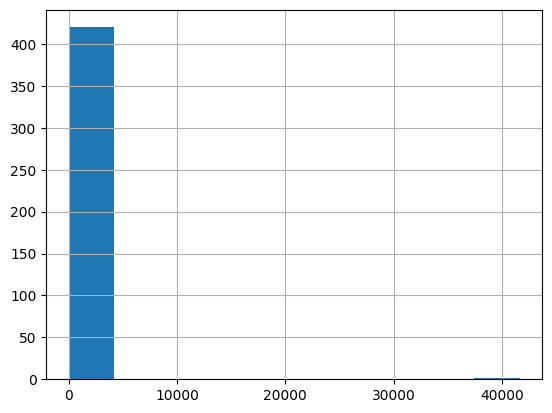

Histogram for Codice via:


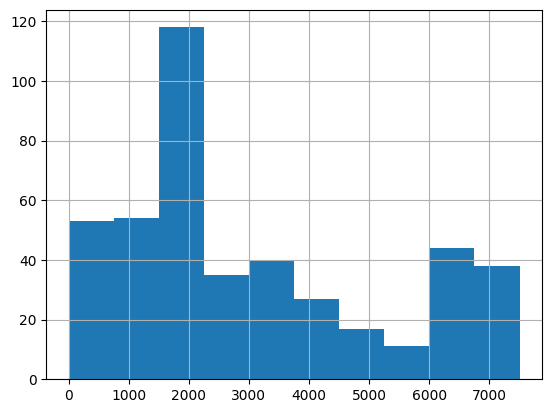

Histogram for ZD:


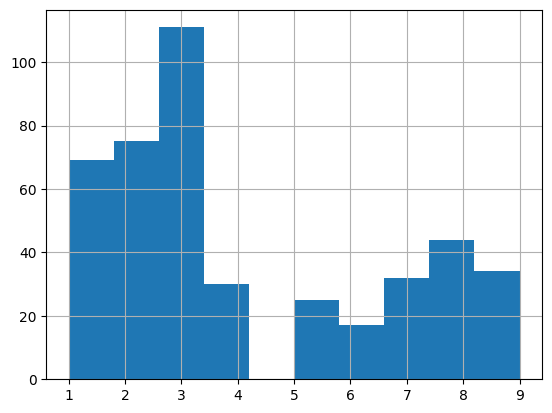

Histogram for Camere:


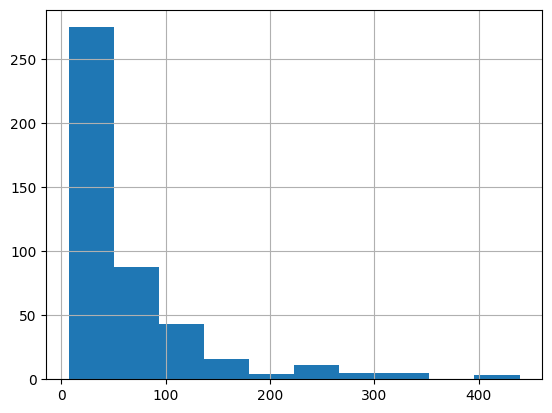

Histogram for Piani totali:


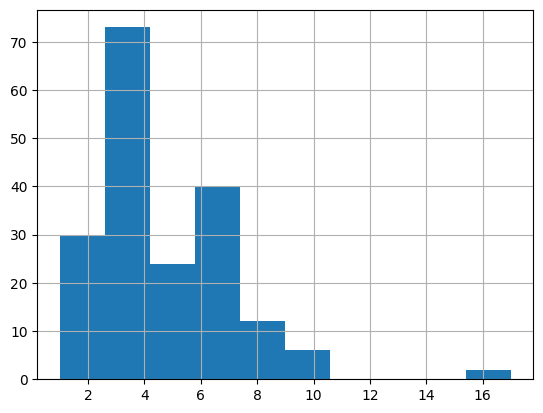

Histogram for Posti letto:


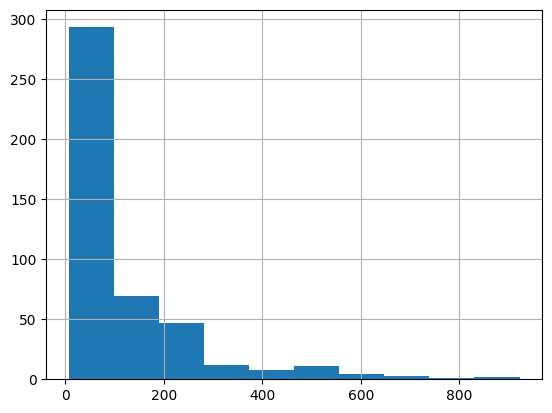

In [504]:
for col in NUM:
    print("Histogram for "+col+":")
    HOTELS[col].hist()
    plt.show()

In [505]:
PROFILE = ProfileReport(HOTELS, title="Pandas Profiling Report")
PROFILE

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**2) DQ ASSESSMENT**

In [506]:
for col in HOTELS.columns:
    print("DQ Assessment for "+col+":")

    DISTINCT = (HOTELS[col].nunique())
    COUNT = HOTELS[col].count()
    ROWS = len(HOTELS[col])
    UNIQUENESS = DISTINCT / ROWS
    print("UNIQUENESS: ", UNIQUENESS)

    DISTINCTNESS = DISTINCT / COUNT
    print("DISTINCTNESS: ", DISTINCTNESS)

    MAX_COUNTS = max(HOTELS[col].value_counts())
    CONSTANCY = MAX_COUNTS / COUNT
    print("CONSTANCY: ", CONSTANCY)

    NOT_NULL = HOTELS.count().sum()
    NULL = HOTELS.isnull().sum().sum()
    TOT = HOTELS.shape[0]*HOTELS.shape[1]
    COMPLETENESS = NOT_NULL / TOT
    print("COMPLETENESS: ", COMPLETENESS)

    print("\n\n")

DQ Assessment for Ubicazione:
UNIQUENESS:  0.9711751662971175
DISTINCTNESS:  0.9711751662971175
CONSTANCY:  0.0066518847006651885
COMPLETENESS:  0.8753880266075388



DQ Assessment for Tipo via:
UNIQUENESS:  0.017738359201773836
DISTINCTNESS:  0.018306636155606407
CONSTANCY:  0.7574370709382151
COMPLETENESS:  0.8753880266075388



DQ Assessment for Descrizione via:
UNIQUENESS:  0.6651884700665188
DISTINCTNESS:  0.6864988558352403
CONSTANCY:  0.02288329519450801
COMPLETENESS:  0.8753880266075388



DQ Assessment for Civico:
UNIQUENESS:  0.19955654101995565
DISTINCTNESS:  0.21377672209026127
CONSTANCY:  0.052256532066508314
COMPLETENESS:  0.8753880266075388



DQ Assessment for Codice via:
UNIQUENESS:  0.6696230598669624
DISTINCTNESS:  0.6910755148741419
CONSTANCY:  0.02288329519450801
COMPLETENESS:  0.8753880266075388



DQ Assessment for ZD:
UNIQUENESS:  0.019955654101995565
DISTINCTNESS:  0.020594965675057208
CONSTANCY:  0.2540045766590389
COMPLETENESS:  0.8753880266075388



DQ Asses

**ACCURACY**

In [507]:
# Queste funzioni servono a verificare la correttezza sintattica dei dati

# Verifica di ogni colonna
def check_ubicazione(value):
    pattern = r'^(VIA|VLE|CSO|PZA|PLE|LGO|GLL|ALZ).*\(z\.d\. \d+\)$'
    return bool(re.match(pattern, value))

def check_isdigit(value, value_range):
    value_str = str(value)
    
    # Controlla se è un numero intero
    if value_str.isdigit():
        num_value = int(value_str)
        return value_range[0] <= num_value <= value_range[1]
    
    # Controlla se è un float con .0 (es. 5.0)
    if value_str.count('.') == 1 and value_str.split('.')[1] == '0' and value_str.split('.')[0].isdigit():
        num_value = float(value_str)
        return value_range[0] <= num_value <= value_range[1]
    
    return False

def check_whitelist(value, whitelisted_values):
    return value in whitelisted_values

def check_numeric_list(value):
    if type(value) == str:
        pattern = r'^\d+(\;\d+)*$'
        return bool(re.match(pattern, value))
    else:
        return bool(0)
    
def check_list(value):
    if type(value) == str:
        pattern = r'^[A-Z0-9]+(\;[A-Z0-9]+)*$'
        return bool(re.match(pattern, value))
    else:
        return bool(0)    

In [508]:
Ubicazione_Valid = HOTELS['Ubicazione'].dropna().apply(check_ubicazione)
accuracy_Ubicazione = Ubicazione_Valid.mean() * 100  # Percentuale di righe valide


Tipo_via_Valid = HOTELS['Tipo via'].dropna().apply(lambda value: check_whitelist(value, ['CSO', 'VIA', 'VLE', 'PZA', 'PLE', 'LGO', 'GLL', 'ALZ']))
accuracy_Tipo_via = Tipo_via_Valid.mean() * 100  # Percentuale di righe valide


Civico_Valid = HOTELS['Civico'].dropna().apply(lambda value: check_isdigit(value, (0, 500)))
accuracy_Civico = Civico_Valid.mean() * 100  # Percentuale di righe valide


Codice_via_Valid = HOTELS['Codice via'].dropna().apply(lambda value: check_isdigit(value, (0, 10000)))
accuracy_Codice_via = Codice_via_Valid.mean() * 100  # Percentuale di righe valide


ZD_Valid = HOTELS['ZD'].dropna().apply(lambda value: check_isdigit(value, (0, 10)))
accuracy_ZD = Codice_via_Valid.mean() * 100  # Percentuale di righe valide


Camere_Valid = HOTELS['Camere'].dropna().apply(lambda value: check_isdigit(value, (0, 500)))
accuracy_Camere = Camere_Valid.mean() * 100  # Percentuale di righe valide


Camere_piano_Valid = HOTELS['Camere piano'].dropna().apply(check_numeric_list)
accuracy_Camere_piano = Camere_piano_Valid.mean() * 100  # Percentuale di righe valide


Categoria_Valid = HOTELS['Categoria'].dropna().apply(lambda value: check_isdigit(value, (1, 5)))
accuracy_Categoria = Categoria_Valid.mean() * 100  # Percentuale di righe valide


Piani_Valid = HOTELS['Piani totali'].dropna().apply(lambda value: check_isdigit(value, (1, 20)))
accuracy_Piani = Piani_Valid.mean() * 100  # Percentuale di righe valide

Piano_piano_Valid = HOTELS['Piano piano'].dropna().apply(check_list)
accuracy_Piano_piano = Piano_piano_Valid.mean() * 100  # Percentuale di righe valide

Posti_letto_Valid = HOTELS['Posti letto'].dropna().apply(lambda value: check_isdigit(value, (1, 1000)))
accuracy_Posti_letto = Posti_letto_Valid.mean() * 100  # Percentuale di righe valide

Posti_letto_piano_Valid = HOTELS['Posti letto per piano'].dropna().apply(check_numeric_list)
accuracy_Posti_letto_piano = Posti_letto_piano_Valid.mean() * 100  # Percentuale di righe valide

Tipo_Attività = HOTELS['Tipo attività struture extra'].dropna().apply(lambda value: check_whitelist(value, ['Albergo', 'Residence']))
Tipo_attività_Categoria = Tipo_Attività.mean() * 100  # Percentuale di righe valide

In [509]:
print("- ACCURACY:")
print(f"    Tipo via Accuracy: {accuracy_Tipo_via:.2f}%")
print(f"    Ubicazione Accuracy: {accuracy_Ubicazione:.2f}%")
print(f"    Civico Accuracy: {accuracy_Civico:.2f}%")
print(f"    Codice via Accuracy: {accuracy_Codice_via:.2f}%")
print(f"    ZD Accuracy: {accuracy_ZD:.2f}%")
print(f"    Camere Accuracy: {accuracy_Camere:.2f}%")
print(f"    Camere piano Accuracy: {accuracy_Camere_piano:.2f}%")
print(f"    Categoria Accuracy: {accuracy_Categoria:.2f}%")
print(f"    Piani totali Accuracy: {accuracy_Piani:.2f}%")
print(f"    Piano piano Accuracy: {accuracy_Piano_piano:.2f}%")
print(f"    Posti letto Accuracy: {accuracy_Posti_letto:.2f}%")
print(f"    Posti letto per piano Accuracy: {accuracy_Posti_letto_piano:.2f}%")
print(f"    Tipo attività Accuracy: {Tipo_attività_Categoria:.2f}%")

- ACCURACY:
    Tipo via Accuracy: 100.00%
    Ubicazione Accuracy: 98.23%
    Civico Accuracy: 99.76%
    Codice via Accuracy: 100.00%
    ZD Accuracy: 100.00%
    Camere Accuracy: 100.00%
    Camere piano Accuracy: 99.13%
    Categoria Accuracy: 98.20%
    Piani totali Accuracy: 100.00%
    Piano piano Accuracy: 96.48%
    Posti letto Accuracy: 100.00%
    Posti letto per piano Accuracy: 99.13%
    Tipo attività Accuracy: 99.09%


**CONSISTENCY**

In [510]:
def safe_sum_split(x):
    if pd.isna(x) or x == "Non specificato":
        return 0
    return sum(int(float(num)) for num in str(x).split(';') if num.strip() and num.strip() != 'nan')

# Funzione di normalizzazione del testo
def normalize(text):
    if pd.isna(text):
        return ""
    text = str(text).strip().upper()
    # Rimuove il punto decimale se esiste ed è seguito da zero
    if text.replace('.', '').isdigit():
        text = str(int(float(text)))
    return text

# Funzione di verifica corrispondenza
def verifica_corrispondenza(riga):
    ubicazione_norm = normalize(riga['Ubicazione'])
    indirizzo_costruito = (
        normalize(riga['Tipo via']) + " " +
        normalize(riga['Descrizione via']) + " N. " +
        normalize(riga['Civico']) + " (Z.D. " +
        normalize(riga['ZD']) + ")"
    )
    #print(ubicazione_norm, ' === ', indirizzo_costruito)
    return ubicazione_norm == indirizzo_costruito

In [511]:
HOTELS['consistency'] = np.where(
    (HOTELS['Piani totali'] == HOTELS['Piano piano'].str.count(';') + 1) &
    (HOTELS['Piani totali'] == HOTELS['Posti letto per piano'].str.count(';') + 1) &
    (HOTELS['Piani totali'] == HOTELS['Camere piano'].str.count(';') + 1) &
    (HOTELS['Camere'] == HOTELS['Camere piano'].apply(safe_sum_split)) &
    (HOTELS['Posti letto'] == HOTELS['Posti letto per piano'].apply(safe_sum_split)) &
    (HOTELS.apply(verifica_corrispondenza, axis=1)), 
    1, 
    0
)
CONSISTENT = HOTELS['consistency'] == 1
CONSISTENT = CONSISTENT.sum()


In [512]:
#count the number of consistent tuples considering the rule
CONSISTENT = HOTELS['consistency'] == 1
CONSISTENT = CONSISTENT.sum()
#count the total number of tuples in the property dataset
COUNT = HOTELS['consistency'].count()
CONSISTENCY = CONSISTENT / COUNT
CONSISTENCY = '{0:.1f}%'.format(CONSISTENCY * 100)

HOTELS = HOTELS.drop(['consistency'], axis=1)

In [513]:
print("- CONSISTENCY:", CONSISTENCY)

- CONSISTENCY: 9.5%


**3) DATA CLEANING (DATA TRANSFORMATION)**

In [514]:
# Non ci sono duplicati quindi non facciamo questa parte

In [515]:
#Change the name of multiple columns: "category" to "cat" and fundedDate to FD
HOTELS.rename(columns ={"Camere ":"Numero_Camere","Camere piano": "Camere_Per_Piano", "Categoria": "Categoria_Stelle", "Piano piano":"Dettaglio_Piani"})

,Ubicazione,Tipo via,Descrizione via,Civico,Codice via,ZD,Camere,Camere_Per_Piano,Categoria_Stelle,Insegna,Piani totali,Dettaglio_Piani,Posti letto,Posti letto per piano,Tipo attività struture extra
0,ALZ NAVIGLIO GRANDE N. 8 (z.d. 6),ALZ,NAVIGLIO GRANDE,8.0,5144.0,6.0,14.0,NaN,4,HOTEL MAISON BORELLA,NaN,NaN,25.0,NaN,Albergo
1,codvia 0000 num.024 ; (),NaN,NaN,NaN,NaN,NaN,259.0,259,4,radisson blu hotel milan,NaN,NaN,518.0,518,Albergo
2,CSO BUENOS AIRES N. 18 (z.d. 3),CSO,BUENOS AIRES,18.0,2129.0,3.0,16.0,16,1,hotel aurora,1.0,1,25.0,25,Albergo
3,CSO BUENOS AIRES N. 26 (z.d. 3),CSO,BUENOS AIRES,26.0,2129.0,3.0,25.0,NaN,3,hotel buenos aires,NaN,NaN,39.0,NaN,Albergo
4,CSO BUENOS AIRES N. 2 (z.d. 3),CSO,BUENOS AIRES,2.0,2129.0,3.0,46.0,15;11;8,3,albergo fenice,4.0,1;2;3;4,98.0,24;19;13,Albergo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,VLE TUNISIA N. 6 (z.d. 3),VLE,TUNISIA,6.0,2121.0,3.0,13.0,16,1,hotel kennedy,1.0,6,23.0,23,Albergo
447,VLE TUNISIA N. 9 (z.d. 3),VLE,TUNISIA,9.0,2121.0,3.0,50.0,3;6;9;9;9,4,st. george hotel,NaN,A;1;2;3;4,99.0,5;16;26;26;26,Albergo
448,VLE VITTORIO VENETO N. 30 (z.d. 2),VLE,VITTORIO VENETO,30.0,2107.0,2.0,15.0,NaN,2,hotel casa mia,NaN,NaN,25.0,NaN,Albergo
449,VLE ZARA N. 1 (z.d. 9),VLE,ZARA,1.0,1170.0,9.0,32.0,NaN,4,casa albergo residence zara lagosta,NaN,NaN,64.0,NaN,Residence


In [516]:
# Conto i valori a null prima di provare a riempirli
null_counts = HOTELS[['Ubicazione', 'Tipo via', 'Descrizione via', 'Civico', 'ZD']].isnull().sum()
null_counts

Ubicazione          0
Tipo via           14
Descrizione via    14
Civico             30
ZD                 14
dtype: int64

In [517]:
# Funzione di normalizzazione del testo
def normalize(text):
    if pd.isna(text):
        return ""
    text = str(text).strip().upper()
    # Rimuove il punto decimale se esiste ed è seguito da zero
    if text.replace('.', '').isdigit():
        text = str(int(float(text)))
    return text

# Funzione di verifica corrispondenza
def verifica_corrispondenza(riga):
    ubicazione_norm = normalize(riga['Ubicazione'])
    indirizzo_costruito = (
        normalize(riga['Tipo via']) + " " +
        normalize(riga['Descrizione via']) + " N. " +
        normalize(riga['Civico']) + " (Z.D. " +
        normalize(riga['ZD']) + ")"
    )
    #if ubicazione_norm[:len(indirizzo_costruito)] != indirizzo_costruito:
    #    print(ubicazione_norm, ' === ', indirizzo_costruito)
    return ubicazione_norm[:len(indirizzo_costruito)] == indirizzo_costruito

In [518]:
# Funzione per estrarre i valori
def estrai_valori(ubicazione):
    # Dizionario per i valori estratti
    risultato = {'Ubicazione': ubicazione, 'Tipo via': None, 'Descrizione via': None, 'Civico': None, 'ZD': None}
    
    # Regex per ciascun campo
    tipo_via_match = re.match(r'^([A-Z]{3})\b', ubicazione)  # Prime 3 lettere maiuscole
    descrizione_via_match = re.search(r'^[A-Z]{3}\s+(.*?)\s+(?:N\.|num\.)', ubicazione)  # Descrizione via
    civico_match = re.search(r'(?:N\.|num\.)\s*(\d+)', ubicazione)  # Numero civico
    zd_match = re.search(r'\(z\.d\.\s*(\d+)\)', ubicazione)  # Zona delimitata (z.d.)
    
    # Popolare il dizionario con i valori trovati
    if tipo_via_match:
        risultato['Tipo via'] = tipo_via_match.group(1)
    if descrizione_via_match:
        risultato['Descrizione via'] = descrizione_via_match.group(1).strip()
    if civico_match:
        risultato['Civico'] = int(civico_match.group(1).lstrip('0'))  # Rimuovere zeri iniziali
    if zd_match:
        risultato['ZD'] = int(zd_match.group(1))
    
    return risultato

In [519]:
righe_da_sostituire = HOTELS[~HOTELS.apply(verifica_corrispondenza, axis=1)]

righe_da_sostituire

,Ubicazione,Tipo via,Descrizione via,Civico,Codice via,ZD,Camere,Camere piano,Categoria,Insegna,Piani totali,Piano piano,Posti letto,Posti letto per piano,Tipo attività struture extra
1,codvia 0000 num.024 ; (),NaN,NaN,NaN,NaN,NaN,259.0,259,4,radisson blu hotel milan,NaN,NaN,518.0,518,Albergo
16,CSO ITALIA num.011/a ; (z.d. 1),NaN,NaN,NaN,NaN,NaN,39.0,8;16;17,3,hotel zurigio,3.0,T;1;2,70.0,14;24;21,Albergo
21,CSO MAGENTA num.019 ; (z.d. 1),NaN,NaN,NaN,NaN,NaN,48.0,8,4,hotel king,6.0,1;2;3;4;5;6,96.0,16;17;15,Albergo
22,CSO MATTEOTTI GIACOMO num.004/6 cinque stelle ...,CSO,MATTEOTTI GIACOMO,NaN,218.0,1.0,154.0,154,l,boscolo hotel exedra,NaN,NaN,308.0,308,Albergo
24,CSO SEMPIONE num.091 ; (z.d. 8),NaN,NaN,NaN,NaN,NaN,113.0,0,4,enterprise hotel,NaN,NaN,216.0,0,Albergo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421,VLE FAENZA N. 12/13 (z.d. 6),VLE,FAENZA,41609.0,5350.0,6.0,8.0,NaN,1,HOTEL FAENZA,NaN,NaN,20.0,NaN,Albergo
427,VLE LOMBARDIA N. 55 licenza rilasciata dallo s...,VLE,LOMBARDIA,55.0,2400.0,3.0,28.0,0,3,HOTEL SAN FRANCISCO,NaN,NaN,55.0,0,Albergo
432,VLE MONZA N. 132 ang. via petrocchi n. 1; (z.d...,VLE,MONZA,132.0,2274.0,2.0,120.0,27;27;12;12;12;12;12;6,4,hotel concorde,8.0,1;2;3;4;5;6;7;8,254.0,45;45;30;30;30;30;30;14,Albergo
438,VLE PIAVE N. 5 2ø piano; (z.d. 1),VLE,PIAVE,5.0,2179.0,1.0,12.0,0,2,atena,NaN,NaN,24.0,0,Albergo


In [520]:
VALORI_ESTRATTI = righe_da_sostituire['Ubicazione'].apply(estrai_valori)
valori_df = pd.DataFrame(list(VALORI_ESTRATTI))
valori_df

,Ubicazione,Tipo via,Descrizione via,Civico,ZD
0,codvia 0000 num.024 ; (),None,None,24.0,NaN
1,CSO ITALIA num.011/a ; (z.d. 1),CSO,ITALIA,11.0,1.0
2,CSO MAGENTA num.019 ; (z.d. 1),CSO,MAGENTA,19.0,1.0
3,CSO MATTEOTTI GIACOMO num.004/6 cinque stelle ...,CSO,MATTEOTTI GIACOMO,4.0,1.0
4,CSO SEMPIONE num.091 ; (z.d. 8),CSO,SEMPIONE,91.0,8.0
...,...,...,...,...,...
56,VLE FAENZA N. 12/13 (z.d. 6),VLE,FAENZA,12.0,6.0
57,VLE LOMBARDIA N. 55 licenza rilasciata dallo s...,VLE,LOMBARDIA,55.0,3.0
58,VLE MONZA N. 132 ang. via petrocchi n. 1; (z.d...,VLE,MONZA,132.0,2.0
59,VLE PIAVE N. 5 2ø piano; (z.d. 1),VLE,PIAVE,5.0,1.0


In [521]:
def update_df_by_location(df1, df2, columns_to_update):

    # Creiamo una copia del df1 per non modificare l'originale
    result_df = df1.copy()
    
    # Iteriamo sulle righe del df2
    for idx2, row2 in df2.iterrows():
        # Troviamo le righe in df1 che hanno la stessa ubicazione
        mask = result_df['Ubicazione'] == row2['Ubicazione']
        
        # Se troviamo corrispondenze, aggiorniamo le colonne specificate
        if mask.any():
            for col in columns_to_update:
                if col in df2.columns:
                    result_df.loc[mask, col] = row2[col]
    
    return result_df


RESULT = update_df_by_location(HOTELS, valori_df, ['Tipo via', 'Descrizione via', 'Civico', 'ZD'])
HOTELS = RESULT

In [522]:
# Conto i valori a null dopo averli riempiti
null_counts = HOTELS[['Ubicazione', 'Tipo via', 'Descrizione via', 'Civico', 'ZD']].isnull().sum()
null_counts

Ubicazione         0
Tipo via           1
Descrizione via    2
Civico             1
ZD                 8
dtype: int64

In [523]:
# Standardizing columns
HOTELS.loc[HOTELS['Tipo via'] == 'CSO', 'Tipo via'] = 'CORSO'
HOTELS.loc[HOTELS['Tipo via'] == 'PZA', 'Tipo via'] = 'PIAZZA'
# HOTELS.loc[HOTELS['Tipo via'] == 'VIA', 'Tipo via'] = 'VIA'
HOTELS.loc[HOTELS['Tipo via'] == 'ALZ', 'Tipo via'] = 'ALZAIA'
HOTELS.loc[HOTELS['Tipo via'] == 'VLE', 'Tipo via'] = 'VIALE'
HOTELS.loc[HOTELS['Tipo via'] == 'PLE', 'Tipo via'] = 'PIAZZALE'
HOTELS.loc[HOTELS['Tipo via'] == 'LGO', 'Tipo via'] = 'LARGO'
HOTELS.loc[HOTELS['Tipo via'] == 'GLL', 'Tipo via'] = 'GALLERIA'
HOTELS.loc[HOTELS['Categoria'] == '1' , 'Categoria'] = '1 STELLA'
HOTELS.loc[HOTELS['Categoria'] == 'l' , 'Categoria'] = '1 STELLA' # ipotizziamo che l sia 1 (ma potrebbe essere "lusso")
HOTELS.loc[HOTELS['Categoria'] == '2', 'Categoria'] = '2 STELLE'
HOTELS.loc[HOTELS['Categoria'] == '3', 'Categoria'] = '3 STELLE'
HOTELS.loc[HOTELS['Categoria'] == '4', 'Categoria'] = '4 STELLE'
HOTELS.loc[HOTELS['Categoria'] == '5', 'Categoria'] = '5 STELLE'
# HOTELS.loc[HOTELS['Categoria'] == '5 STELLE LUSSO', 'Categoria'] = '5 STELLE LUSSO'
HOTELS.loc[HOTELS['Tipo attività struture extra'] == 'Albergo', 'Tipo attività struture extra'] = 'Hotel'
# RIEMPIO CON NON SPECIFICATO I CAMPI VUOTI
HOTELS['Tipo attività struture extra'] = HOTELS['Tipo attività struture extra'].fillna('Non Specificato')
HOTELS['Insegna'] = HOTELS['Insegna'].fillna('Non Specificato')

In [524]:
# I define critical cols and i drop rows with missing values for critical columns
critical_columns = ['Tipo via', 'Descrizione via', 'Civico', 'ZD', 'Categoria']
HOTELS = HOTELS.dropna(subset=critical_columns, axis=0)
HOTELS = HOTELS.drop(['Ubicazione'], axis=1)

In [525]:
# Conto i valori a null prima di provare a riempirli
null_counts = HOTELS[['Piani totali']].isnull().sum()
null_counts

Piani totali    253
dtype: int64

In [526]:
def calcola_piani_totali(piano_piano):
    # print('Piano piano: ', piano_piano, '    valore estratto: ', piano_piano.count(';') + 1)
    return piano_piano.count(';') + 1

In [527]:
# provo a recuperare le informazioni sul numero di piani totali dalla colonna "Piano piano" e poi dalle colonne "Camere piano" e "Posti letto per piano"

# Trova le righe in cui "Piani totali" è NaN e "Piano piano" ha un valore
mask = HOTELS["Piani totali"].isna() & HOTELS["Piano piano"].notna()

# Calcola il nuovo valore per "Piani totali"
HOTELS.loc[mask, "Piani totali"] = HOTELS.loc[mask, "Piano piano"].apply(calcola_piani_totali)


In [528]:
# Trova le righe in cui "Piani totali" è NaN e almeno una tra "Camere piano" e "Posti letto per piano" ha un valore
mask_camere = HOTELS["Piani totali"].isna() & HOTELS["Camere piano"].notna()
mask_posti = HOTELS["Piani totali"].isna() & HOTELS["Posti letto per piano"].notna()

# Crea una maschera per le righe in cui entrambe le colonne hanno valori
mask_entrambi = mask_camere & mask_posti

count_Piani_totali_aggiunti = 0
# Gestisci il caso in cui entrambe le colonne hanno un valore (tutti i casi)
for idx in HOTELS[mask_entrambi].index:
    camere_valore = calcola_piani_totali(HOTELS.loc[idx, "Camere piano"])
    posti_valore = calcola_piani_totali(HOTELS.loc[idx, "Posti letto per piano"])
    if camere_valore == posti_valore:
        count_Piani_totali_aggiunti=count_Piani_totali_aggiunti + 1
        HOTELS.loc[idx, "Piani totali"] = camere_valore
count_Piani_totali_aggiunti


131

In [529]:
# Conto i valori a null dopo averli riempiti
null_counts = HOTELS[['Piani totali']].isnull().sum()
null_counts

Piani totali    92
dtype: int64

In [530]:
# dopo aver usato la colonna "Piano piano" per estrarre dei dati non ci serve più
# HOTELS = HOTELS.drop(["Piano piano"], axis=1)

In [531]:
def costruisci_piano_piano(piani_totali):
    # print("Piani totali: ", piani_totali, "stringa: ", ";".join(str(i) for i in range(1, int(piani_totali) + 1)))
    return ";".join(str(i) for i in range(1, int(piani_totali) + 1))

In [532]:
# posso completare la colonna "Piano piano" dove ho il numero di piani (ipotizziamo un valore di default in base ai piani totali)
mask_piano_piano_NaN = HOTELS["Piano piano"].isna() & HOTELS["Piani totali"].notna()

# Calcola il nuovo valore per "Piano piano"
HOTELS.loc[mask_piano_piano_NaN, "Piano piano"] = HOTELS.loc[mask_piano_piano_NaN, "Piani totali"].apply(costruisci_piano_piano)


In [533]:
# Adesso posso cercare tutti gli hotel con 1 solo piano e completare tutti i campi a NaN delle colonne "Camere piano" e "Posti letto per piano"
mask =  HOTELS["Piani totali"] == 1

HOTELS.loc[mask, "Camere piano"] = HOTELS.loc[mask, "Camere"].round().astype(int).astype(str)
HOTELS.loc[mask, "Posti letto per piano"] = HOTELS.loc[mask, "Posti letto"].round().astype(int).astype(str)


In [534]:
# Ora provo ad aggiustare i dati sulle colonne "Camere piano" e "Posti letto per piano" dove possibile, prendendo per veri i dati su "Camere" e "Posti letto"

def adjust_dataframe(df, col_num, col_stringa, col_piani):
    def adjust_row(row):
        num = row[col_num]
        stringa = row[col_stringa]
        piani = row[col_piani]

        # Check for NaN or empty values
        if pd.isna(num) or pd.isna(stringa) or pd.isna(piani) or stringa.strip() == '':
            return row

        # Convert stringa to a list of integers
        stringa = str(stringa)
        numbers = [int(x) if x else 0 for x in stringa.split(';')]

        # Check if the sum exceeds num
        if sum(numbers) > num:
            row[col_stringa] = "Non specificato"
            return row

        # Check conditions
        if sum(numbers) != num or len(numbers) != piani:
            print("Num:", num,", Stringa:", stringa,", Piani:", piani)
            if len(numbers) > piani:  # Too many numbers
                while len(numbers) > piani:
                    if 0 in numbers:
                        numbers.remove(0)
                    else:
                        numbers[-2] += numbers[-1]
                        numbers.pop()
                # print(numbers)
                # numbers = numbers[:piani]  # Trim to the correct size

            elif len(numbers) < piani:  # Not enough numbers
                diff = num - sum(numbers)
                while len(numbers) < piani - 1:
                    to_add = int(diff // (piani - len(numbers)))
                    numbers.append(to_add)
                    diff -= to_add
                numbers.append(int(diff))

            # Adjust if any remaining discrepancy
            diff = num - sum(numbers)
            if diff != 0:
                numbers[-1] += int(diff)  # Add the remaining difference to the last element

            print(';'.join(map(str, numbers)))

        # Convert back to string format
        row[col_stringa] = ';'.join(map(str, numbers))
        
        return row

    return df.apply(adjust_row, axis=1)

In [535]:
df = HOTELS
HOTELS = adjust_dataframe(HOTELS, 'Camere', 'Camere piano', 'Piani totali')
HOTELS = adjust_dataframe(HOTELS, 'Posti letto', 'Posti letto per piano', 'Piani totali')
HOTELS



Num: 46.0 , Stringa: 15;11;8 , Piani: 4.0
15;11;8;12
Num: 116.0 , Stringa: 4;23;24;24 , Piani: 4.0
4;23;24;65
Num: 89.0 , Stringa: 12;12;12;12;12;11;5 , Piani: 7.0
12;12;12;12;12;11;18
Num: 48.0 , Stringa: 8 , Piani: 6.0
8;8;8;8;8;8
Num: 40.0 , Stringa: 11;11 , Piani: 2.0
11;29
Num: 60.0 , Stringa: 3;10;;;;4;13 , Piani: 7.0
3;10;0;0;0;4;43
Num: 87.0 , Stringa: 12;16;16;14;12;10;4 , Piani: 7.0
12;16;16;14;12;10;7
Num: 242.0 , Stringa: 19;36;30;34;33;27;26 , Piani: 8.0
19;36;30;34;33;27;26;37
Num: 29.0 , Stringa: 5;6;6 , Piani: 3.0
5;6;18
Num: 99.0 , Stringa: 6;6;6;6;6;6;6;6;6;6 , Piani: 10.0
6;6;6;6;6;6;6;6;6;45
Num: 313.0 , Stringa: 48;50;41;41;41;43;10;10;10 , Piani: 9.0
48;50;41;41;41;43;10;10;29
Num: 228.0 , Stringa: 6;28;29;26;24;13 , Piani: 10.0
6;28;29;26;24;13;25;25;26;26
Num: 63.0 , Stringa: 9 , Piani: 7.0
9;9;9;9;9;9;9
Num: 327.0 , Stringa: 45;43;45;41;6;1 , Piani: 6.0
45;43;45;41;6;147
Num: 119.0 , Stringa: 15;15;15;15;16;10 , Piani: 6.0
15;15;15;15;16;43
Num: 106.0 , Stringa

,Tipo via,Descrizione via,Civico,Codice via,ZD,Camere,Camere piano,Categoria,Insegna,Piani totali,Piano piano,Posti letto,Posti letto per piano,Tipo attività struture extra
0,ALZAIA,NAVIGLIO GRANDE,8.0,5144.0,6.0,14.0,NaN,4 STELLE,HOTEL MAISON BORELLA,NaN,NaN,25.0,NaN,Hotel
2,CORSO,BUENOS AIRES,18.0,2129.0,3.0,16.0,16,1 STELLA,hotel aurora,1.0,1,25.0,25,Hotel
3,CORSO,BUENOS AIRES,26.0,2129.0,3.0,25.0,NaN,3 STELLE,hotel buenos aires,NaN,NaN,39.0,NaN,Hotel
4,CORSO,BUENOS AIRES,2.0,2129.0,3.0,46.0,15;11;8;12,3 STELLE,albergo fenice,4.0,1;2;3;4,98.0,24;19;13;42,Hotel
5,CORSO,BUENOS AIRES,33.0,2129.0,3.0,65.0,65,4 STELLE,GALAXY G SRL,1.0,1,97.0,97,Hotel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,VIALE,TUNISIA,6.0,2121.0,3.0,13.0,13,1 STELLA,hotel kennedy,1.0,6,23.0,23,Hotel
447,VIALE,TUNISIA,9.0,2121.0,3.0,50.0,3;6;9;9;23,4 STELLE,st. george hotel,5.0,A;1;2;3;4,99.0,5;16;26;26;26,Hotel
448,VIALE,VITTORIO VENETO,30.0,2107.0,2.0,15.0,NaN,2 STELLE,hotel casa mia,NaN,NaN,25.0,NaN,Hotel
449,VIALE,ZARA,1.0,1170.0,9.0,32.0,NaN,4 STELLE,casa albergo residence zara lagosta,NaN,NaN,64.0,NaN,Residence


In [536]:
HOTELS.dtypes

Tipo via                         object
Descrizione via                  object
Civico                          float64
Codice via                      float64
ZD                              float64
Camere                          float64
Camere piano                     object
Categoria                        object
Insegna                          object
Piani totali                    float64
Piano piano                      object
Posti letto                     float64
Posti letto per piano            object
Tipo attività struture extra     object
dtype: object

In [537]:
format_mapping = {
        "Camere": "{:,.0f}",       # No decimals for room counts
        "Posti letto": "{:,.0f}",  # No decimals for bed counts
        "Codice via": "{:,.0f}",  # No decimals for bed counts
        "ZD": "{:,.0f}",  # No decimals for bed counts
        "Civico": "{:,.0f}",       # Formatting house numbers as integers
        "Piani totali": "{:,.0f}", # Formatting total floors as integers
        "Categoria": "{}"          # Keep category as it is
    }
# HOTELS.style.format(format_mapping)

**4) DATA CLEANING (ERROR DETECTION&CORRECTION MISSING VALUES)**

In [538]:
HOTELS["Codice via"] = HOTELS["Codice via"].fillna("Non specificato")

In [539]:
# ipotizzo che tutti gli hotel che non hanno valori sulla colonna "Piani totali" abbiano un solo piano
HOTELS["Piani totali"] = HOTELS["Piani totali"].fillna(int(1))
HOTELS["Piano piano"] = HOTELS["Piano piano"].fillna("1")

In [540]:
# Di conseguenza completo anche le colonne "Camere piano" e "Posti letto per piano"
HOTELS = HOTELS.fillna({
    'Camere piano': HOTELS['Camere'].round().astype(int).astype(str),
    'Posti letto per piano': HOTELS['Posti letto'].round().astype(int).astype(str)
})

In [541]:
HOTELS

,Tipo via,Descrizione via,Civico,Codice via,ZD,Camere,Camere piano,Categoria,Insegna,Piani totali,Piano piano,Posti letto,Posti letto per piano,Tipo attività struture extra
0,ALZAIA,NAVIGLIO GRANDE,8.0,5144.0,6.0,14.0,14,4 STELLE,HOTEL MAISON BORELLA,1.0,1,25.0,25,Hotel
2,CORSO,BUENOS AIRES,18.0,2129.0,3.0,16.0,16,1 STELLA,hotel aurora,1.0,1,25.0,25,Hotel
3,CORSO,BUENOS AIRES,26.0,2129.0,3.0,25.0,25,3 STELLE,hotel buenos aires,1.0,1,39.0,39,Hotel
4,CORSO,BUENOS AIRES,2.0,2129.0,3.0,46.0,15;11;8;12,3 STELLE,albergo fenice,4.0,1;2;3;4,98.0,24;19;13;42,Hotel
5,CORSO,BUENOS AIRES,33.0,2129.0,3.0,65.0,65,4 STELLE,GALAXY G SRL,1.0,1,97.0,97,Hotel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,VIALE,TUNISIA,6.0,2121.0,3.0,13.0,13,1 STELLA,hotel kennedy,1.0,6,23.0,23,Hotel
447,VIALE,TUNISIA,9.0,2121.0,3.0,50.0,3;6;9;9;23,4 STELLE,st. george hotel,5.0,A;1;2;3;4,99.0,5;16;26;26;26,Hotel
448,VIALE,VITTORIO VENETO,30.0,2107.0,2.0,15.0,15,2 STELLE,hotel casa mia,1.0,1,25.0,25,Hotel
449,VIALE,ZARA,1.0,1170.0,9.0,32.0,32,4 STELLE,casa albergo residence zara lagosta,1.0,1,64.0,64,Residence


In [542]:
HOTELS.isnull().sum()


Tipo via                        0
Descrizione via                 0
Civico                          0
Codice via                      0
ZD                              0
Camere                          0
Camere piano                    0
Categoria                       0
Insegna                         0
Piani totali                    0
Piano piano                     0
Posti letto                     0
Posti letto per piano           0
Tipo attività struture extra    0
dtype: int64

**5) DATA CLEANING (ERROR DETECTION&CORRECTION OUTLIERS)**

In [543]:
ZS(HOTELS["Posti letto"], 5)


The detected outliers are:  [864.0, 922.0]


In [544]:
from pathlib import Path
Path('HOTELS_after_pipeline.csv').unlink()

HOTELS.to_csv('HOTELS_after_pipeline.csv', index=False,                    # Rimuove la colonna degli indici
          encoding='utf-8-sig',           # Supporto caratteri speciali
          decimal=',',                    # Usa la virgola come separatore decimale
          sep=';',                        # Usa il punto e virgola come separatore
          float_format='%.2f') 

**7) BRIEF DATA QUALITY ASSESSMENT**

In [545]:
# Colonna Ubicazione eliminata
HOTELS.columns

Index(['Tipo via', 'Descrizione via', 'Civico', 'Codice via', 'ZD', 'Camere',
       'Camere piano', 'Categoria', 'Insegna', 'Piani totali', 'Piano piano',
       'Posti letto', 'Posti letto per piano', 'Tipo attività struture extra'],
      dtype='object')

In [546]:
HOTELS.describe()

,Civico,ZD,Camere,Piani totali,Posti letto
count,436.000000,436.000000,436.000000,436.000000,436.000000
mean,26.752294,4.119266,59.504587,2.816514,113.107798
std,35.046742,2.633907,70.049555,2.558430,140.242564
min,1.000000,1.000000,7.000000,1.000000,7.000000
25%,7.000000,2.000000,15.000000,1.000000,25.000000
50%,15.000000,3.000000,32.000000,1.000000,60.000000
75%,32.000000,7.000000,72.000000,4.000000,139.750000
max,371.000000,9.000000,439.000000,17.000000,922.000000


In [547]:
NUM = list(HOTELS.select_dtypes(include=['int64','float64']).columns)
DATA_NUM = HOTELS[NUM]
DATA_NUM.corr(method ='pearson')

,Civico,ZD,Camere,Piani totali,Posti letto
Civico,1.000000,0.098317,-0.013869,-0.029326,-0.013445
ZD,0.098317,1.000000,0.061373,-0.139002,0.078636
Camere,-0.013869,0.061373,1.000000,0.309717,0.980510
Piani totali,-0.029326,-0.139002,0.309717,1.000000,0.296336
Posti letto,-0.013445,0.078636,0.980510,0.296336,1.000000


Histogram for Civico:


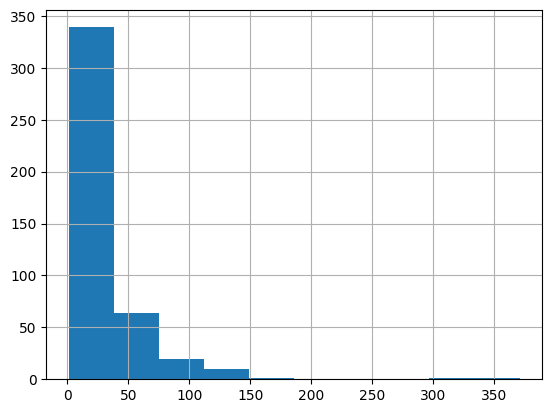

Histogram for ZD:


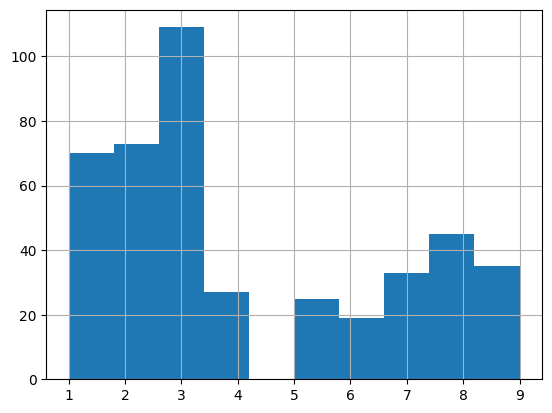

Histogram for Camere:


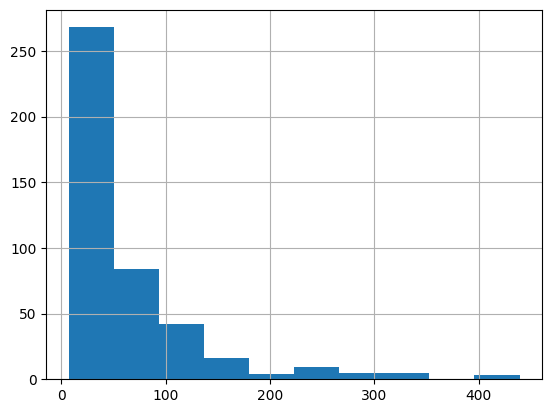

Histogram for Piani totali:


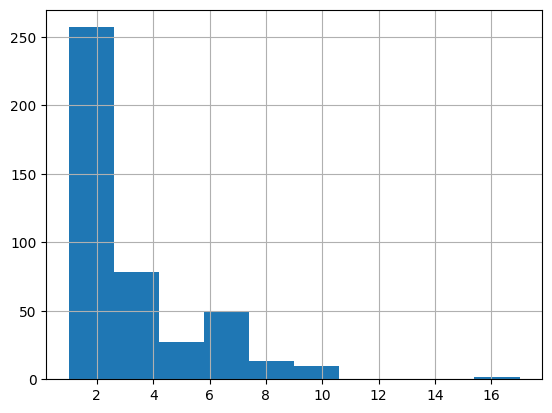

Histogram for Posti letto:


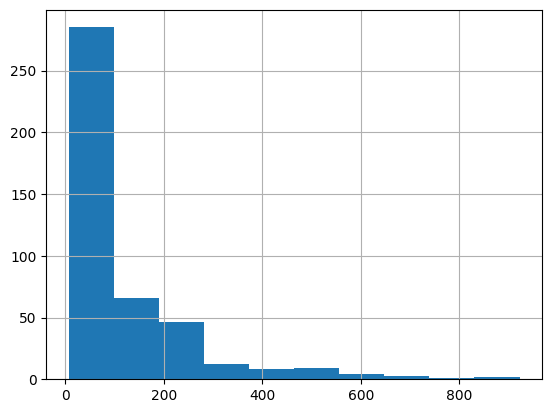

In [548]:
for col in NUM:
    print("Histogram for "+col+":")
    HOTELS[col].hist()
    plt.show()

In [549]:
PROFILE = ProfileReport(HOTELS, title="Pandas Profiling Report")
PROFILE

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [550]:
for col in HOTELS.columns:
    print("DQ Assessment for "+col+":")

    DISTINCT = (HOTELS[col].nunique())
    COUNT = HOTELS[col].count()
    ROWS = len(HOTELS[col])
    UNIQUENESS = DISTINCT / ROWS
    print("UNIQUENESS: ", UNIQUENESS)

    DISTINCTNESS = DISTINCT / COUNT
    print("DISTINCTNESS: ", DISTINCTNESS)

    MAX_COUNTS = max(HOTELS[col].value_counts())
    CONSTANCY = MAX_COUNTS / COUNT
    print("CONSTANCY: ", CONSTANCY)

    NOT_NULL = HOTELS.count().sum()
    NULL = HOTELS.isnull().sum().sum()
    TOT = HOTELS.shape[0]*HOTELS.shape[1]
    COMPLETENESS = NOT_NULL / TOT
    print("COMPLETENESS: ", COMPLETENESS)

    print("\n\n")

DQ Assessment for Tipo via:
UNIQUENESS:  0.01834862385321101
DISTINCTNESS:  0.01834862385321101
CONSTANCY:  0.7545871559633027
COMPLETENESS:  1.0



DQ Assessment for Descrizione via:
UNIQUENESS:  0.6788990825688074
DISTINCTNESS:  0.6788990825688074
CONSTANCY:  0.022935779816513763
COMPLETENESS:  1.0



DQ Assessment for Civico:
UNIQUENESS:  0.20412844036697247
DISTINCTNESS:  0.20412844036697247
CONSTANCY:  0.05045871559633028
COMPLETENESS:  1.0



DQ Assessment for Codice via:
UNIQUENESS:  0.676605504587156
DISTINCTNESS:  0.676605504587156
CONSTANCY:  0.022935779816513763
COMPLETENESS:  1.0



DQ Assessment for ZD:
UNIQUENESS:  0.020642201834862386
DISTINCTNESS:  0.020642201834862386
CONSTANCY:  0.25
COMPLETENESS:  1.0



DQ Assessment for Camere:
UNIQUENESS:  0.33256880733944955
DISTINCTNESS:  0.33256880733944955
CONSTANCY:  0.05504587155963303
COMPLETENESS:  1.0



DQ Assessment for Camere piano:
UNIQUENESS:  0.5871559633027523
DISTINCTNESS:  0.5871559633027523
CONSTANCY:  0.0642201

**Accuracy**

In [551]:
Tipo_via_Valid = HOTELS['Tipo via'].dropna().apply(lambda value: check_whitelist(value, ['CSO', 'VIA', 'VLE', 'PZA', 'PLE', 'LGO', 'GLL', 'ALZ']))
accuracy_Tipo_via = Tipo_via_Valid.mean() * 100  # Percentuale di righe valide


Civico_Valid = HOTELS['Civico'].dropna().apply(lambda value: check_isdigit(value, (0, 500)))
accuracy_Civico = Civico_Valid.mean() * 100  # Percentuale di righe valide


Codice_via_Valid = HOTELS['Codice via'].dropna().apply(lambda value: check_isdigit(value, (0, 10000)))
accuracy_Codice_via = Codice_via_Valid.mean() * 100  # Percentuale di righe valide


ZD_Valid = HOTELS['Codice via'].dropna().apply(lambda value: check_isdigit(value, (0, 10)))
accuracy_ZD = Codice_via_Valid.mean() * 100  # Percentuale di righe valide


Camere_Valid = HOTELS['Camere'].dropna().apply(lambda value: check_isdigit(value, (0, 500)))
accuracy_Camere = Camere_Valid.mean() * 100  # Percentuale di righe valide


Camere_piano_Valid = HOTELS['Camere piano'].dropna().apply(check_numeric_list)
accuracy_Camere_piano = Camere_piano_Valid.mean() * 100  # Percentuale di righe valide


Categoria_Valid = HOTELS['Categoria'].dropna().apply(lambda value: check_isdigit(value, (1, 5)))
accuracy_Categoria = Categoria_Valid.mean() * 100  # Percentuale di righe valide


Piani_Valid = HOTELS['Piani totali'].dropna().apply(lambda value: check_isdigit(value, (1, 20)))
accuracy_Piani = Piani_Valid.mean() * 100  # Percentuale di righe valide

Piano_piano_Valid = HOTELS['Piano piano'].dropna().apply(check_list)
accuracy_Piano_piano = Piano_piano_Valid.mean() * 100  # Percentuale di righe valide

Posti_letto_Valid = HOTELS['Posti letto'].dropna().apply(lambda value: check_isdigit(value, (1, 1000)))
accuracy_Posti_letto = Posti_letto_Valid.mean() * 100  # Percentuale di righe valide

Posti_letto_piano_Valid = HOTELS['Posti letto per piano'].dropna().apply(check_numeric_list)
accuracy_Posti_letto_piano = Posti_letto_piano_Valid.mean() * 100  # Percentuale di righe valide

Tipo_Attività = HOTELS['Tipo attività struture extra'].dropna().apply(lambda value: check_whitelist(value, ['Albergo', 'Residence']))
Tipo_attività_Categoria = Tipo_Attività.mean() * 100  # Percentuale di righe valide

In [552]:
# Avendo cambiato i valori di alcune colonne i risultati delle accuracy sono errati

print("- ACCURACY:")
print(f"    Tipo via Accuracy: {accuracy_Tipo_via:.2f}%")
print(f"    Ubicazione Accuracy: {accuracy_Ubicazione:.2f}%")
print(f"    Civico Accuracy: {accuracy_Civico:.2f}%")
print(f"    Codice via Accuracy: {accuracy_Codice_via:.2f}%")
print(f"    ZD Accuracy: {accuracy_ZD:.2f}%")
print(f"    Camere Accuracy: {accuracy_Camere:.2f}%")
print(f"    Camere piano Accuracy: {accuracy_Camere_piano:.2f}%")
print(f"    Categoria Accuracy: {accuracy_Categoria:.2f}%")
print(f"    Piani totali Accuracy: {accuracy_Piani:.2f}%")
print(f"    Piano piano Accuracy: {accuracy_Piano_piano:.2f}%")
print(f"    Posti letto Accuracy: {accuracy_Posti_letto:.2f}%")
print(f"    Posti letto per piano Accuracy: {accuracy_Posti_letto_piano:.2f}%")
print(f"    Tipo attività Accuracy: {Tipo_attività_Categoria:.2f}%")

- ACCURACY:
    Tipo via Accuracy: 75.46%
    Ubicazione Accuracy: 98.23%
    Civico Accuracy: 100.00%
    Codice via Accuracy: 97.71%
    ZD Accuracy: 97.71%
    Camere Accuracy: 100.00%
    Camere piano Accuracy: 93.58%
    Categoria Accuracy: 0.00%
    Piani totali Accuracy: 100.00%
    Piano piano Accuracy: 98.39%
    Posti letto Accuracy: 100.00%
    Posti letto per piano Accuracy: 96.79%
    Tipo attività Accuracy: 11.24%


**Consistency**

In [553]:
HOTELS['consistency'] = np.where(
    (HOTELS['Piani totali'] == HOTELS['Piano piano'].str.count(';') + 1) &
    (HOTELS['Piani totali'] == HOTELS['Posti letto per piano'].str.count(';') + 1) &
    (HOTELS['Piani totali'] == HOTELS['Camere piano'].str.count(';') + 1) &
    (HOTELS['Camere'] == HOTELS['Camere piano'].apply(safe_sum_split)) &
    (HOTELS['Posti letto'] == HOTELS['Posti letto per piano'].apply(safe_sum_split)), 
    1, 
    0
)
CONSISTENT = HOTELS['consistency'] == 1
CONSISTENT = CONSISTENT.sum()

In [554]:
#count the number of consistent tuples considering the rule
CONSISTENT = HOTELS['consistency'] == 1
CONSISTENT = CONSISTENT.sum()
#count the total number of tuples in the property dataset
COUNT = HOTELS['consistency'].count()
CONSISTENCY = CONSISTENT / COUNT
CONSISTENCY = '{0:.1f}%'.format(CONSISTENCY * 100)

HOTELS = HOTELS.drop(['consistency'], axis=1)

In [555]:
print("- CONSISTENCY:", CONSISTENCY)

- CONSISTENCY: 88.3%
